In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from prettytable import PrettyTable
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn import model_selection

from gensim.models import Word2Vec

In [2]:
con = sqlite3.connect('./final_review_data_set.db')
review_data = pd.read_sql_query("select * from Review",con)

review_data.shape , display(review_data.head()) , review_data.isna().any()

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,0,150529,0006641040,A25ACLV5KPB4W,"Matt Hetling ""Matt""",0,1,1,1108425600,"Nice cadence, catchy rhymes",junei saw charming groupof roses beginto droop...
1,1,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,1,1191456000,chicken soup with rice months,fun way children learn months year learn poems...
2,2,150506,0006641040,A2IW4PEEKO2R0U,Tracy,1,1,1,1194739200,"Love the book, miss the hard cover version",grew reading sendak books watching really rosi...
3,3,150505,0006641040,A2PTSM496CF40Z,"Jason A. Teeple ""Nobody made a greater mistak...",1,1,1,1210809600,A classic,get movie sound track sing along carol king gr...
4,4,150504,0006641040,AQEYF1AXARWJZ,"Les Sinclair ""book maven""",1,1,1,1212278400,Chicken Soup with Rice,entertaining rhyming story cleaver catchy illu...


((393931, 11),
 None,
 index                     False
 Id                        False
 ProductId                 False
 UserId                    False
 ProfileName               False
 HelpfulnessNumerator      False
 HelpfulnessDenominator    False
 Score                     False
 Time                      False
 Summary                   False
 Text                      False
 dtype: bool)

In [3]:
# review_data = review_data.sample(10000)

In [4]:
X_data = review_data.drop(['Score'],axis=1)
y_data = review_data['Score']

In [5]:
count_vect = CountVectorizer(min_df=0.01)
X_bow = count_vect.fit_transform(X_data['Text'].values)
X_bow

<393931x632 sparse matrix of type '<class 'numpy.int64'>'
	with 7841554 stored elements in Compressed Sparse Row format>

In [6]:
#applying fit transform on train datasset
tf_idf_vect = TfidfVectorizer(min_df=0.01)
x_tfidf = tf_idf_vect.fit_transform(X_data['Text'].values)

In [6]:
textsplits = [text.split() for text in X_data['Text'].values]
len(textsplits)

393931

In [7]:
w2v_model = Word2Vec(textsplits,min_count=10,vector_size=65)
X_w2v_vec = w2v_model.wv.key_to_index.keys()


In [8]:
len(X_w2v_vec)

24818

In [9]:
w2v_words_set = set(X_w2v_vec)
list_vectors = []

In [10]:
from concurrent.futures import ThreadPoolExecutor



def process_text(text):
    vec_sum = np.zeros(65)
    count_words = 0

    for w in set(text) & w2v_words_set:
        vec_sum += w2v_model.wv[w]
        count_words += 1

    if count_words != 0:
        text_vec = vec_sum / count_words
    else:
        text_vec = np.zeros(65)

    return text_vec

with ThreadPoolExecutor() as executor:
    list_vectors = list(tqdm(executor.map(process_text, textsplits), total=len(textsplits)))

# list_vectors = np.array(list_vectors)  # Convert the list to a NumPy array

print(len(list_vectors))
print(len(list_vectors[0]))


100%|██████████| 393931/393931 [01:08<00:00, 5752.27it/s]  


393931
65


In [10]:
X_w2v = np.array(list_vectors)
X_w2v.shape

(0,)

In [11]:
# tfidf - word2vec
tf_idf_model = TfidfVectorizer()
tf_idf_matrix = tf_idf_model.fit_transform(X_data['Text'].values)
mapped_data = dict(zip(tf_idf_model.get_feature_names_out(), list(tf_idf_model.idf_)))
# mapped_data

In [12]:
from concurrent.futures import ThreadPoolExecutor

tfidf_text_vectors = []
tfw2v_words_set = set(mapped_data.keys())
def process_text(text):
    text_vec = np.zeros(65)
    weight_sum = 0 

    for w in set(text) & tfw2v_words_set & w2v_words_set:
        vec = w2v_model.wv[w]
        data = mapped_data[w]*(text.count(w)/len(text))
        text_vec += (vec * data)
        weight_sum += data

    if weight_sum != 0:
        text_vec /= weight_sum
    else:
        text_vec = np.zeros(65)

    return text_vec

with ThreadPoolExecutor() as executor:
    tfidf_text_vectors = list(tqdm(executor.map(process_text, textsplits), total=len(textsplits)))

# tfidf_text_vectors = np.array(tfidf_text_vectors)  # Convert the list to a NumPy array

print(len(tfidf_text_vectors))
print(len(tfidf_text_vectors[0]))


100%|██████████| 393931/393931 [00:01<00:00, 219200.13it/s]

393931
65


In [14]:
X_tfw2v = np.array(tfidf_text_vectors)


In [22]:
# K Means Clustering

In [23]:
# Applying K - Means Clustering on BOW

In [41]:
k_values = list(range(2,21))
loss = []
for i in k_values:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_bow[:30000])
    loss.append(kmeans.inertia_)

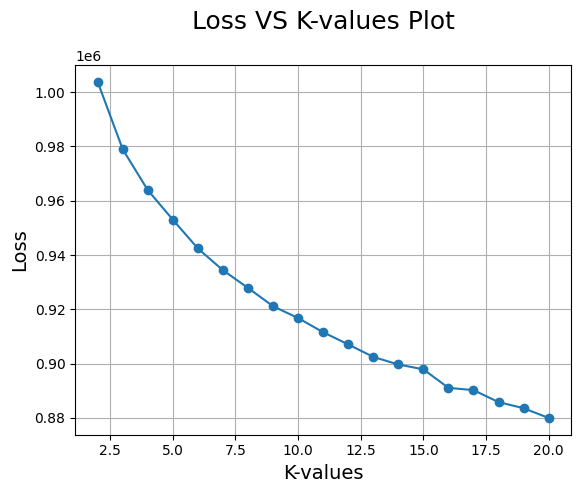

In [42]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()


In [43]:
# the most optimized value is 10 , after that it decreses slowly

In [44]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 10 subplots because our k range is between 2-10 
    fig, axes = plt.subplots(5, 2, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(
                              coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("\nCluster {} word cloud\n".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [50]:
# optimal k value
optimal_k=10

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k)
kmeans.fit(X_bow)

KMeans(n_clusters=10)

10


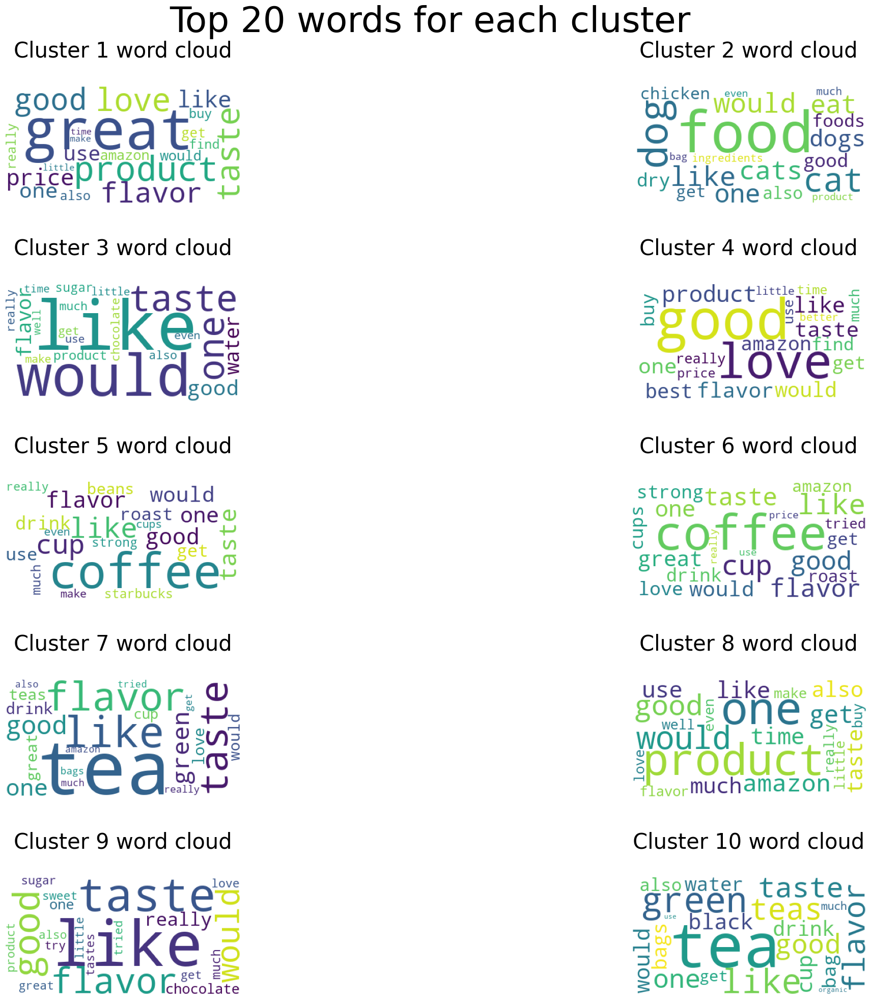

In [51]:
# getting feature names in features 
# and the cluster centers in coef
# Plot the all cluster with their corresponding features
features = count_vect.get_feature_names_out()
coef = kmeans.cluster_centers_
plot_cluster_cloud(features, coef)

In [52]:
#TFIDF


In [49]:
k_values = list(range(2,21))
loss = []
for i in k_values:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(x_tfidf[:30000])
    loss.append(kmeans.inertia_)

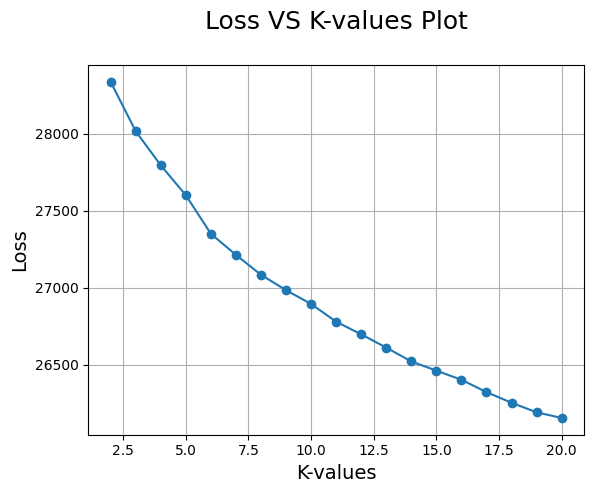

In [38]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [39]:
# the most optimized value is 12 , after that it decreses slowly

In [53]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 10 subplots because our k range is between 2-10 
    fig, axes = plt.subplots(5, 2, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(
                              coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("\nCluster {} word cloud\n".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [54]:
# optimal k value
optimal_k=12

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k)
kmeans.fit(x_tfidf)

KMeans(n_clusters=12)

12


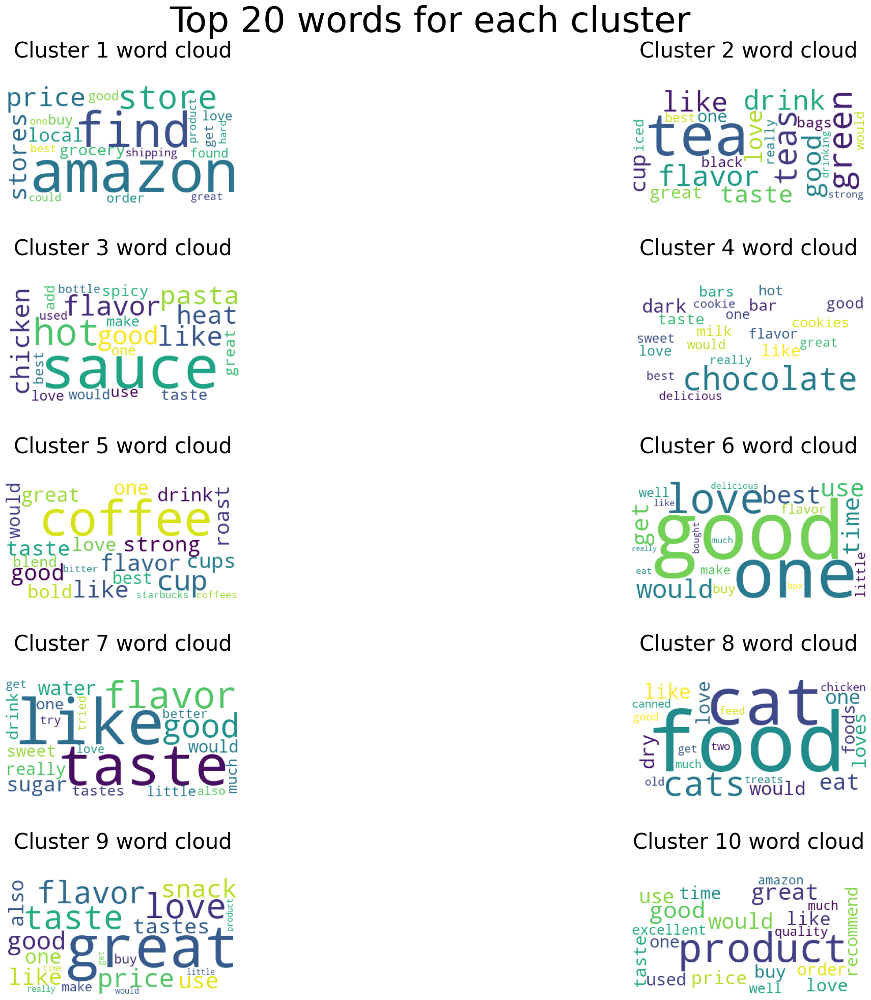

In [55]:
# getting feature names in features 
# and the cluster centers in coef
# Plot the all cluster with their corresponding features
features = tf_idf_vect.get_feature_names_out()
coef = kmeans.cluster_centers_
plot_cluster_cloud(features, coef)

In [56]:
# AVG W2V

In [57]:
k_values = list(range(2,21))
loss = []
for i in k_values:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_w2v[:30000])
    loss.append(kmeans.inertia_)

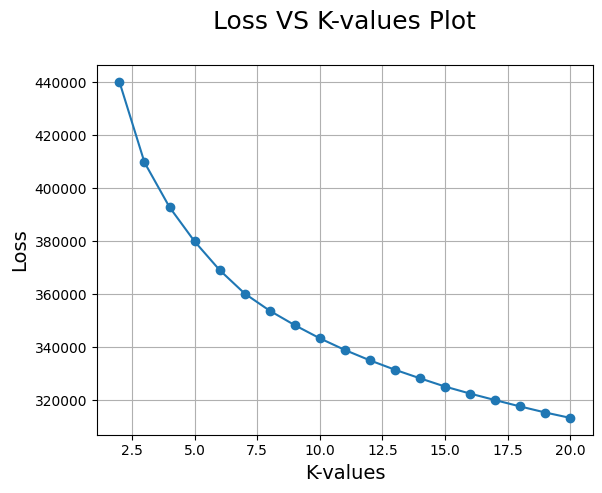

In [58]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [59]:
# the most optimized value is 9 , after that it decreses slowly

In [60]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 10 subplots because our k range is between 2-10 
    fig, axes = plt.subplots(5, 2, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(
                              coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("\nCluster {} word cloud\n".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [61]:
# optimal k value
optimal_k=9

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k)
kmeans.fit(X_w2v)

KMeans(n_clusters=9)

In [73]:
review_data["cluster_label"] = kmeans.labels_

In [74]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

Total number of review in cluster 0 is: 49689


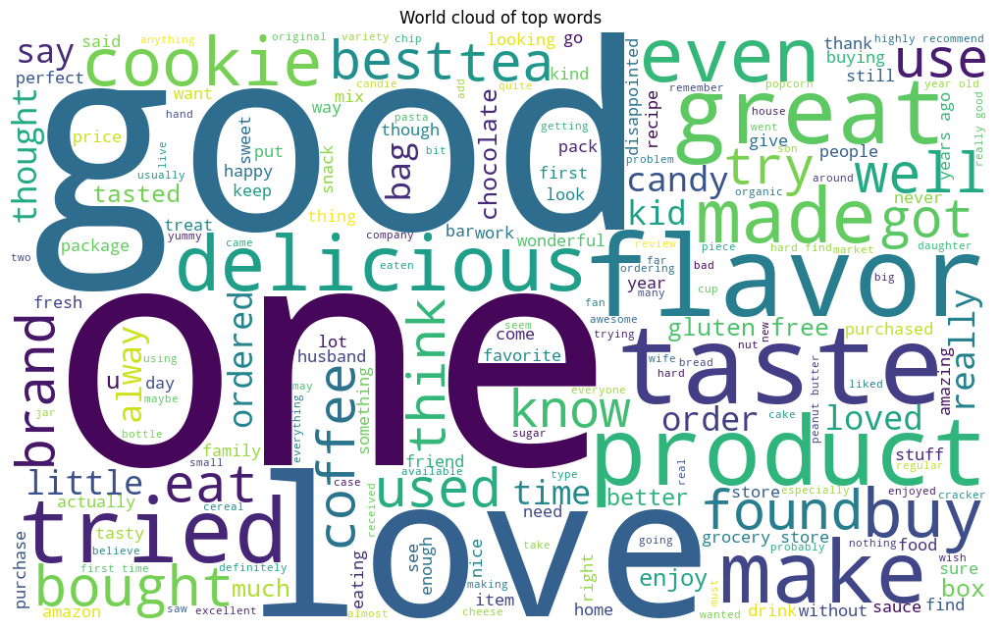

Total number of review in cluster 1 is: 41758


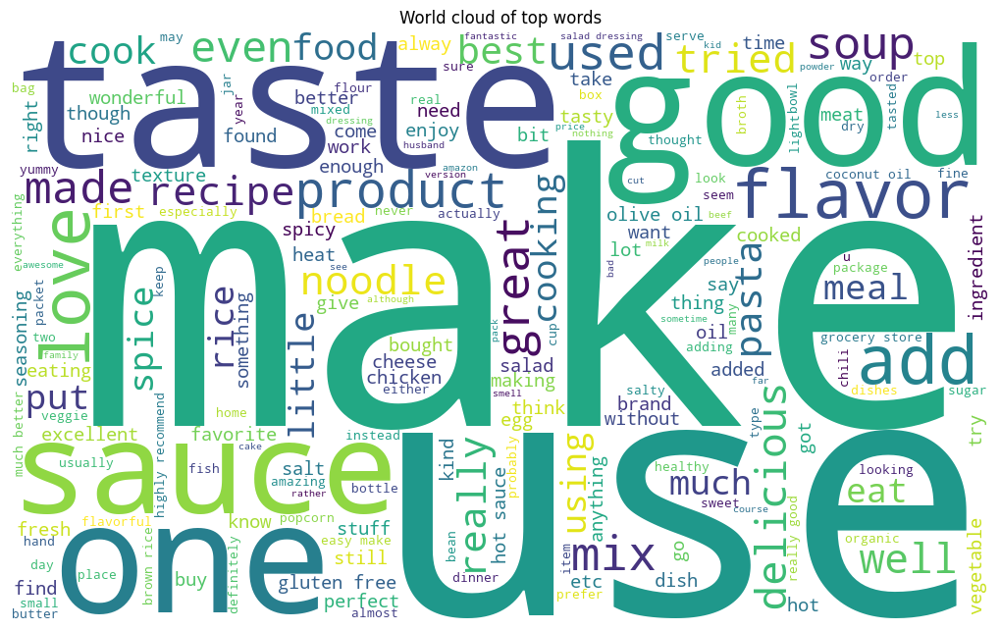

Total number of review in cluster 2 is: 32682


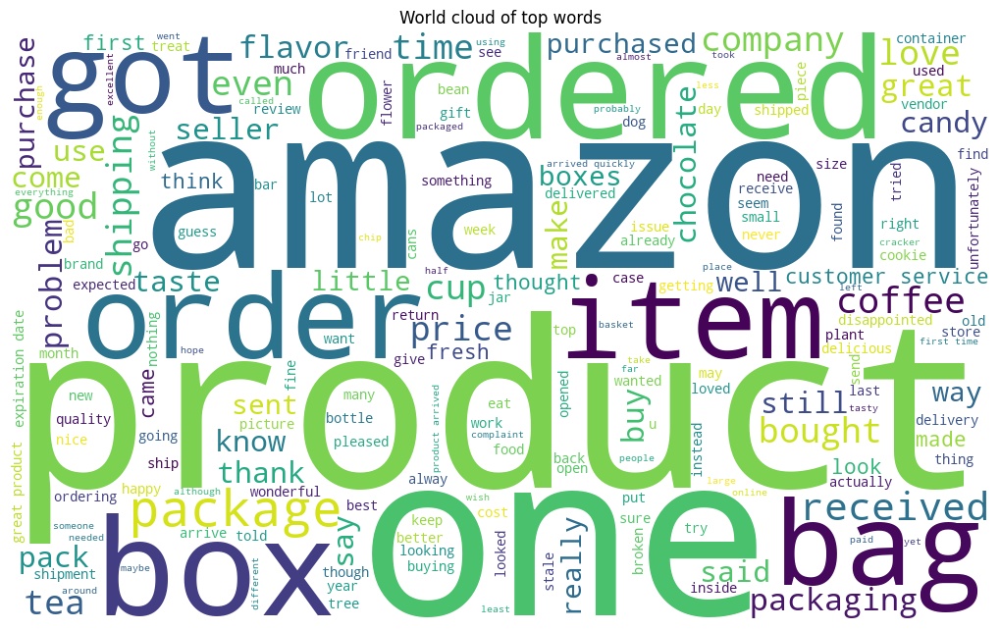

Total number of review in cluster 3 is: 41340


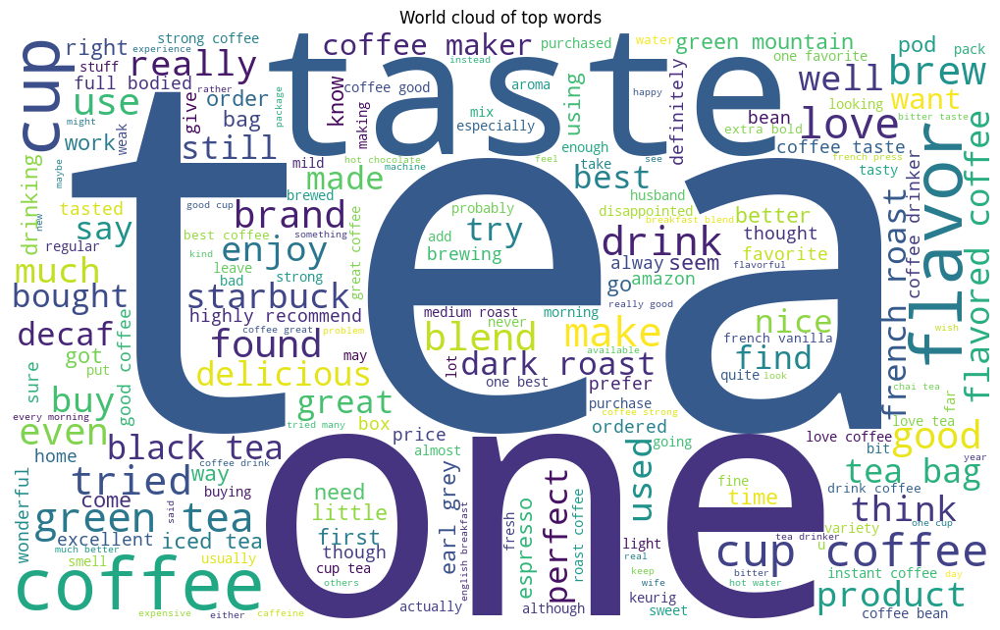

Total number of review in cluster 4 is: 37990


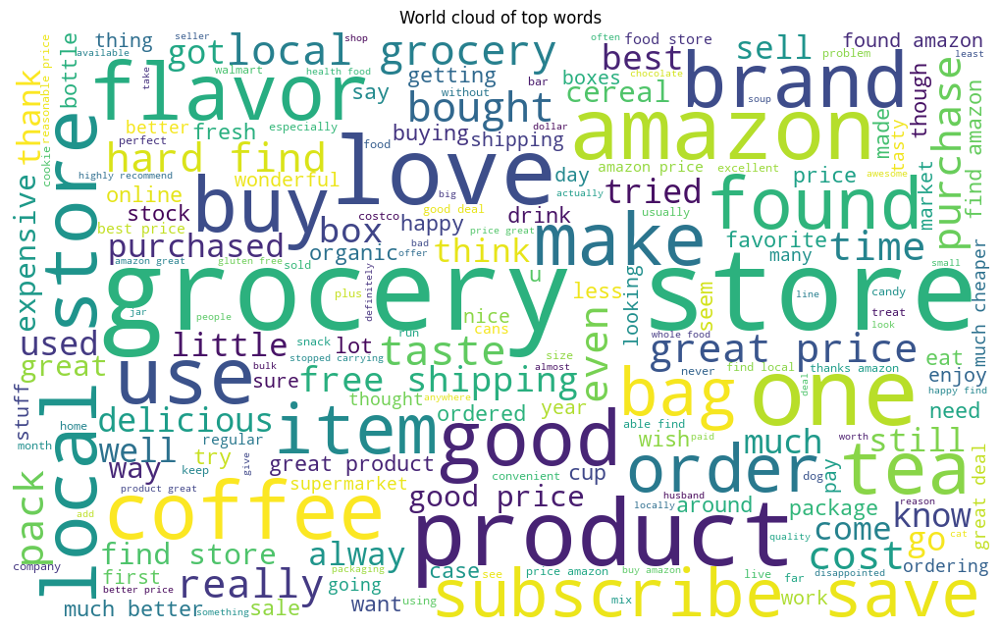

Total number of review in cluster 5 is: 45752


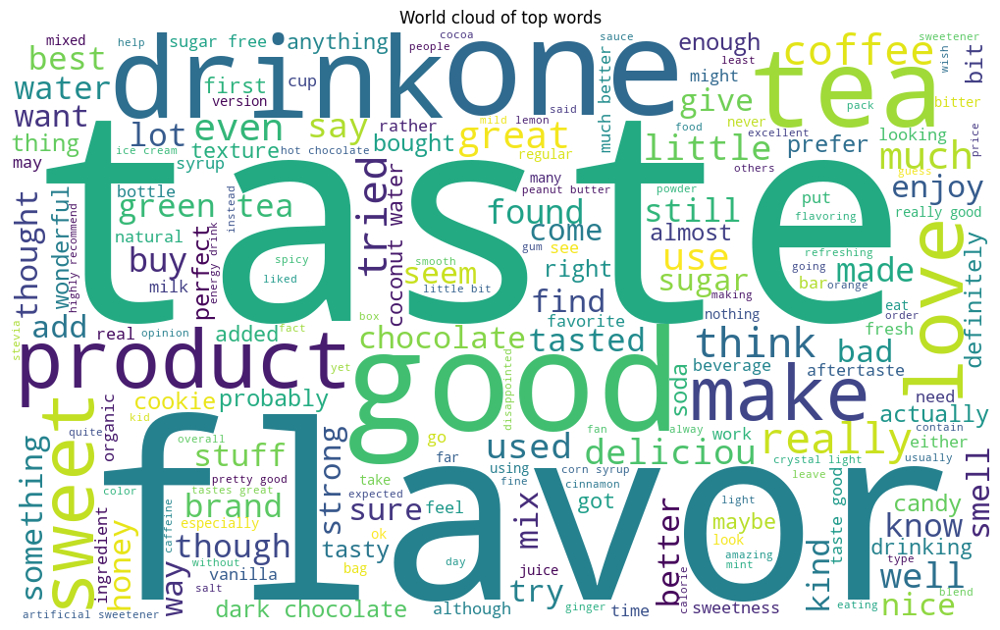

Total number of review in cluster 6 is: 35608


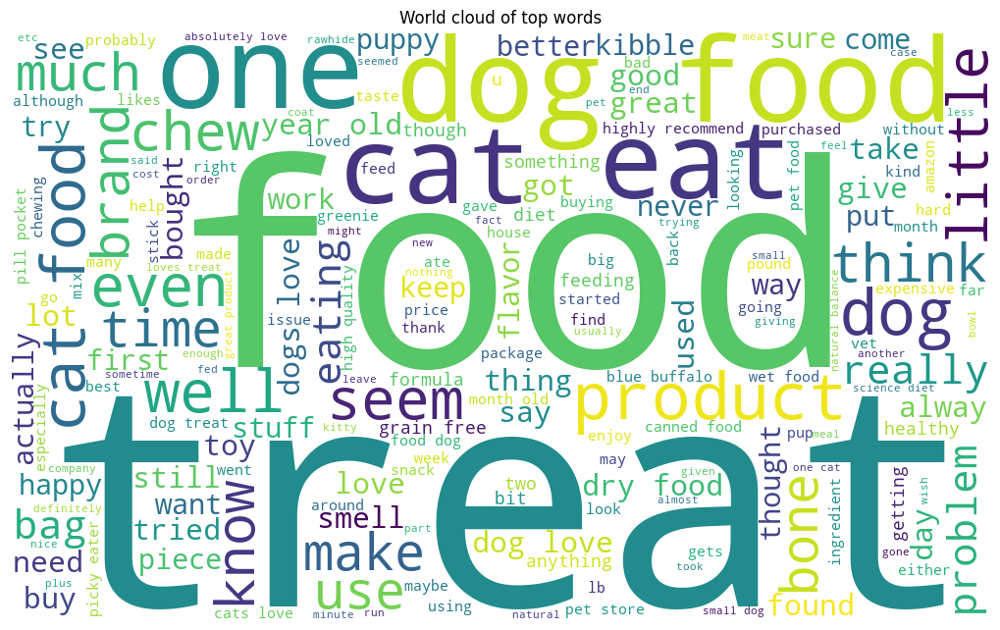

Total number of review in cluster 7 is: 65034


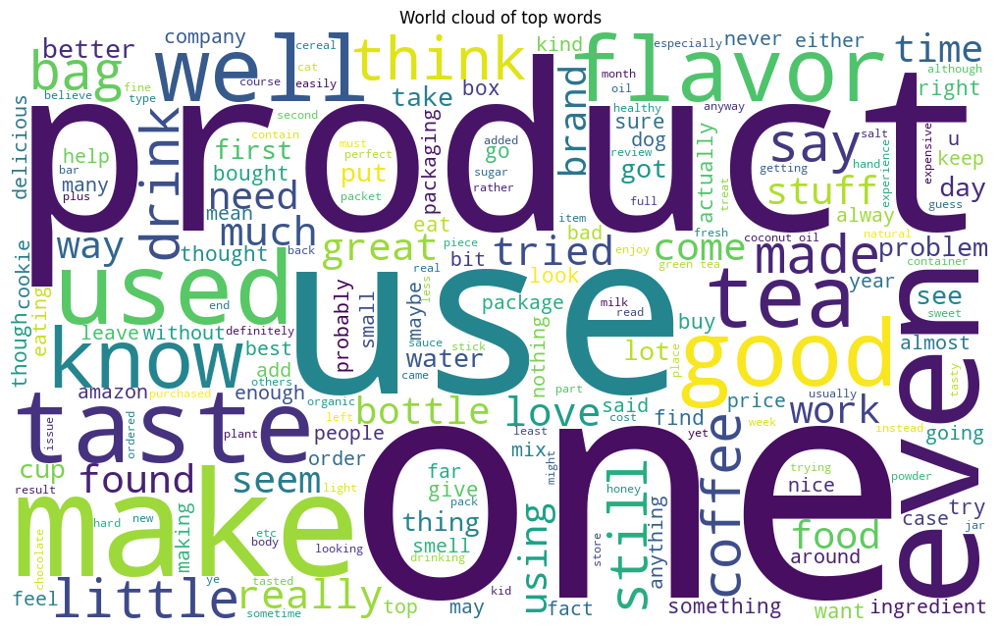

Total number of review in cluster 8 is: 44078


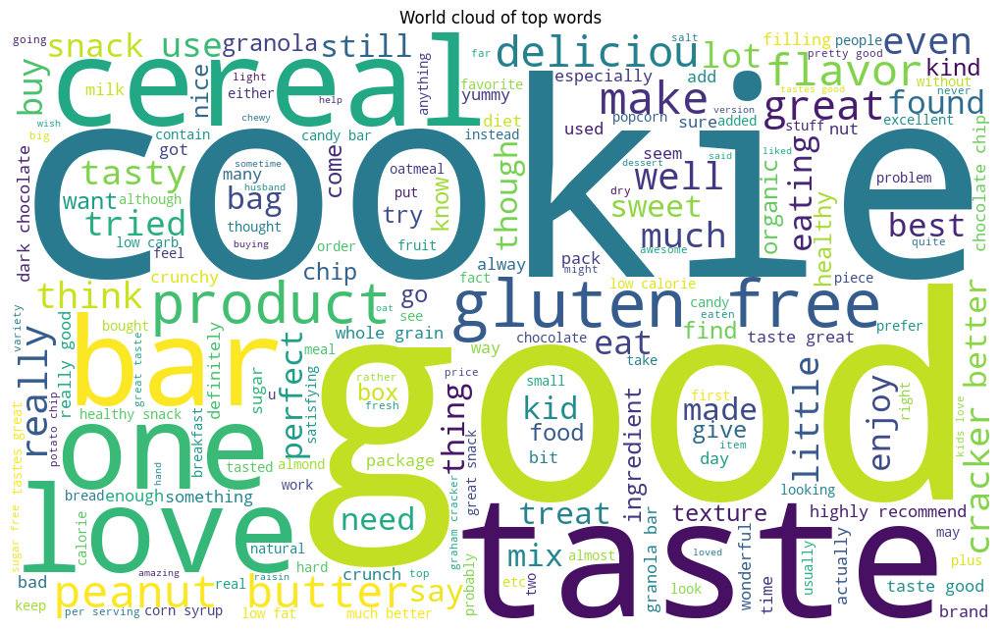

In [76]:
# For each cluster, group with its corresponding label.
for i in range(kmeans.n_clusters):
    l = list()
    label = review_data.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(review_data.loc[label[j]]["Text"])
    print("Total number of review in cluster {} is: {}".format(i+1, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

In [77]:
#TFIDF W2V

In [78]:
k_values = list(range(2,21))
loss = []
for i in k_values:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_tfw2v[:30000])
    loss.append(kmeans.inertia_)

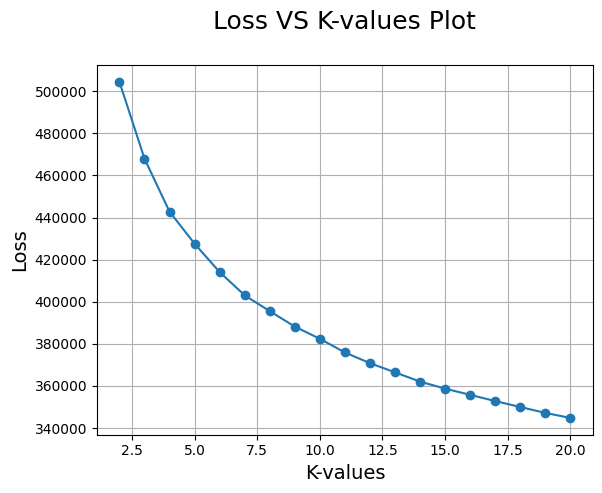

In [79]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [80]:
# the most optimized value is 8 , after that it decreses slowly

In [81]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 10 subplots because our k range is between 2-10 
    fig, axes = plt.subplots(5, 2, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(
                              coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("\nCluster {} word cloud\n".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [82]:
# optimal k value
optimal_k=8

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k)
kmeans.fit(X_tfw2v)

KMeans()

In [83]:
review_data["cluster_label"] = kmeans.labels_

In [84]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

Total number of review in cluster 1 is: 71743


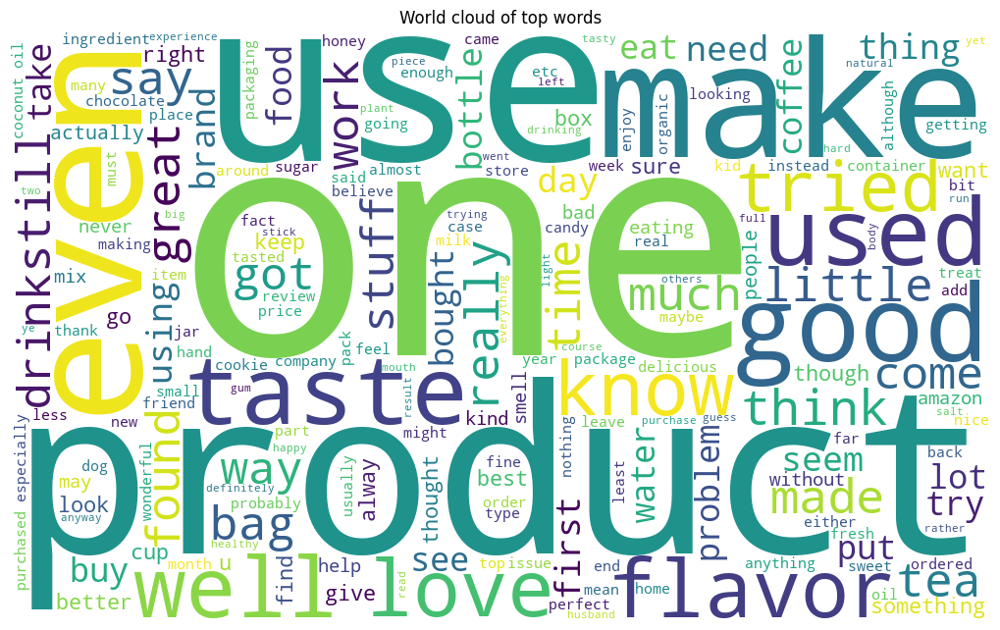

Total number of review in cluster 2 is: 45270


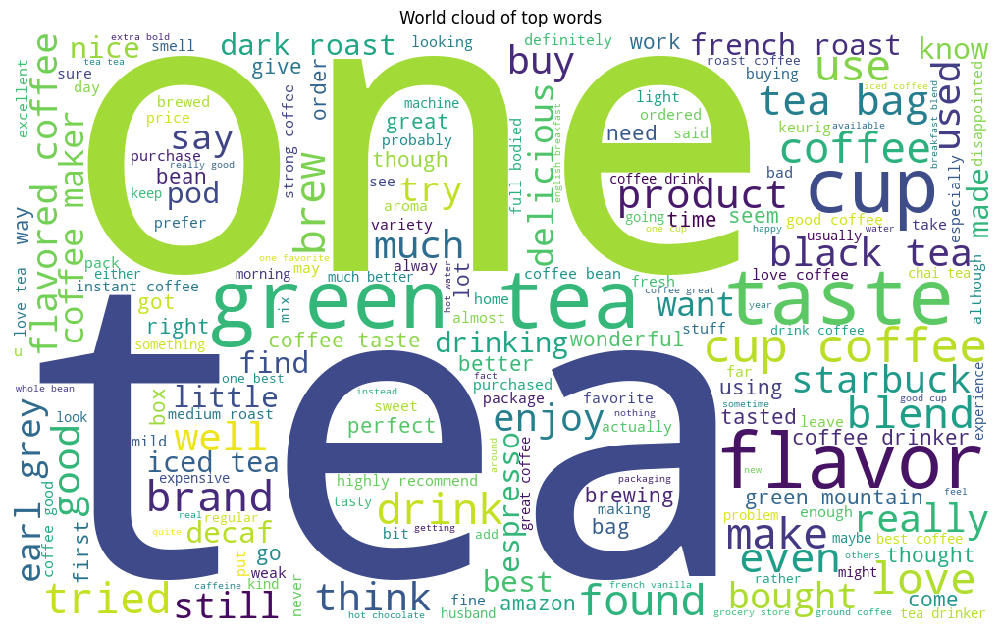

Total number of review in cluster 3 is: 40729


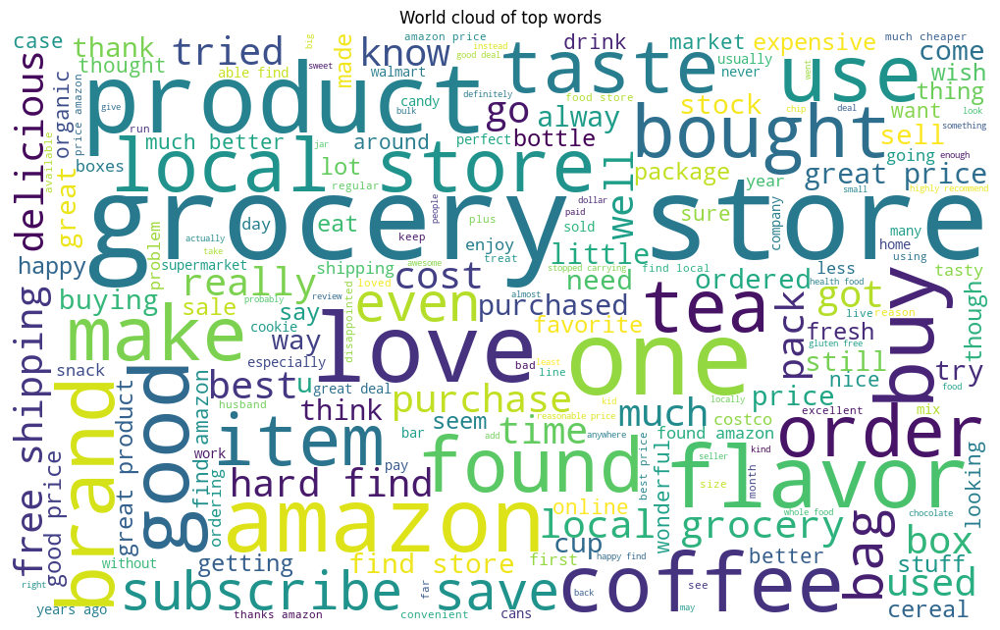

Total number of review in cluster 4 is: 45228


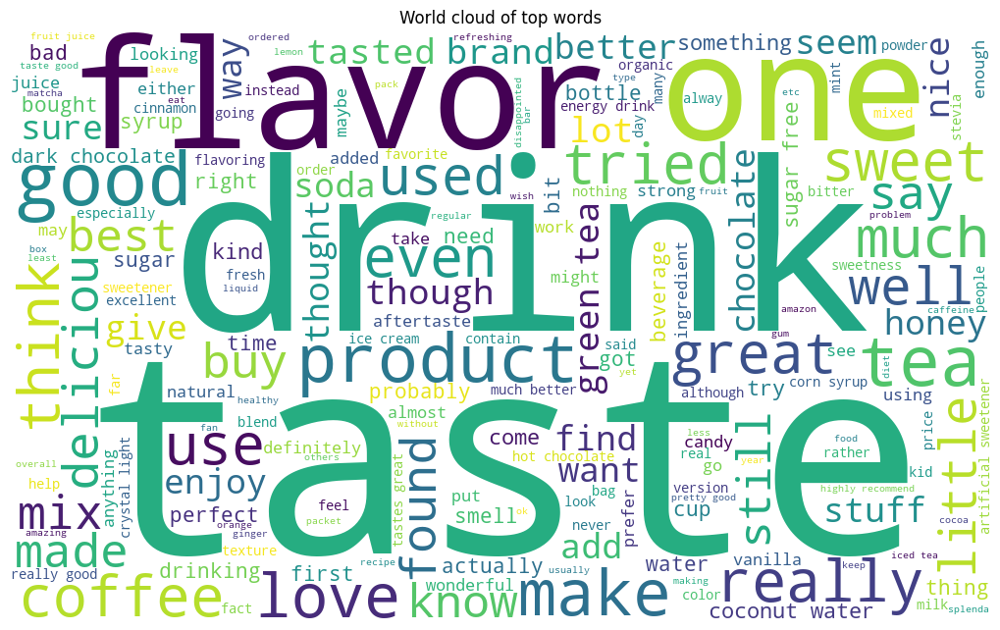

Total number of review in cluster 5 is: 51447


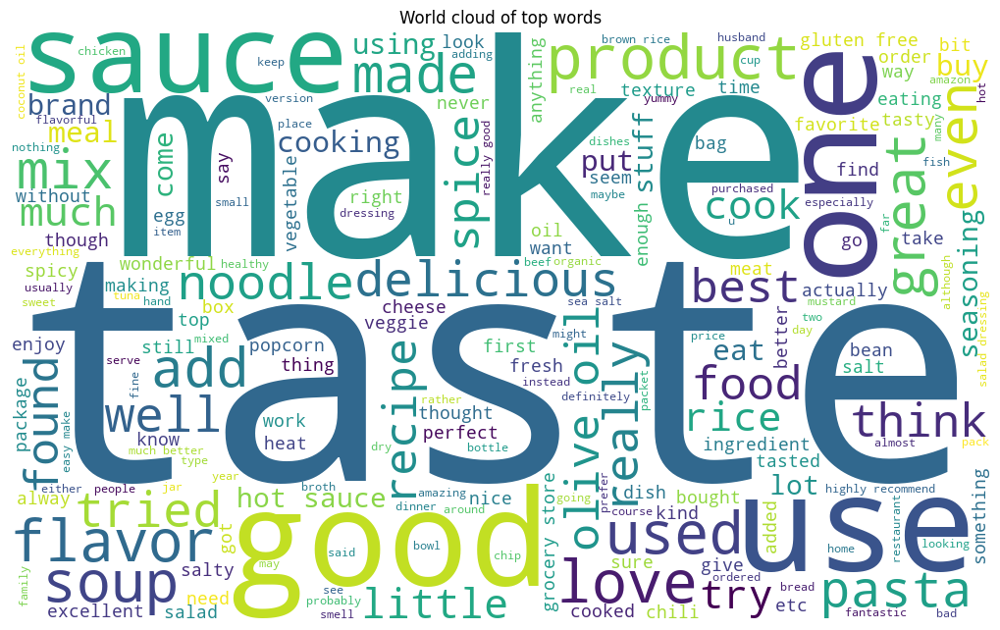

Total number of review in cluster 6 is: 43609


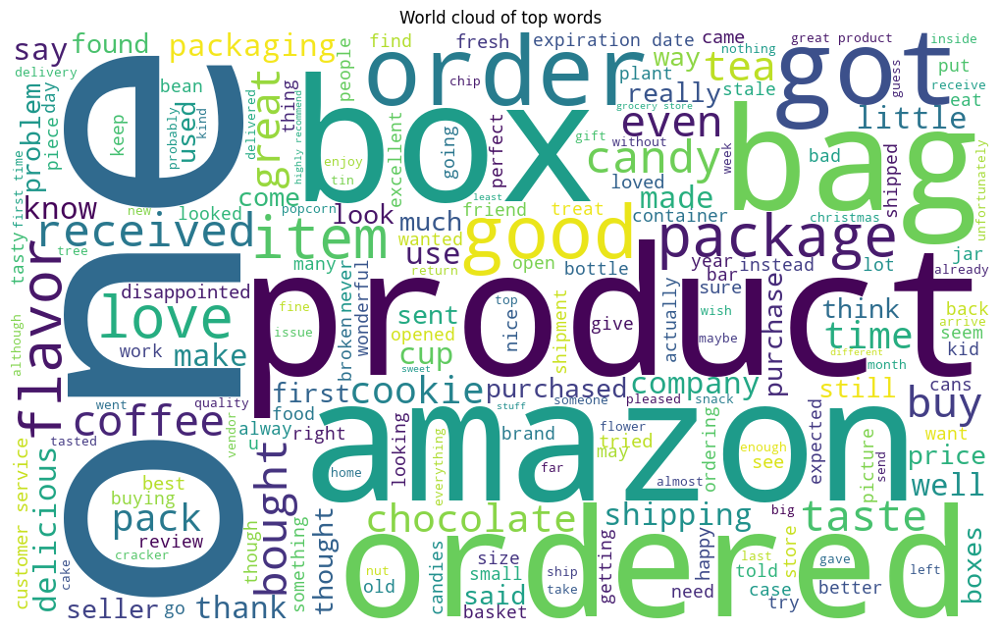

Total number of review in cluster 7 is: 59751


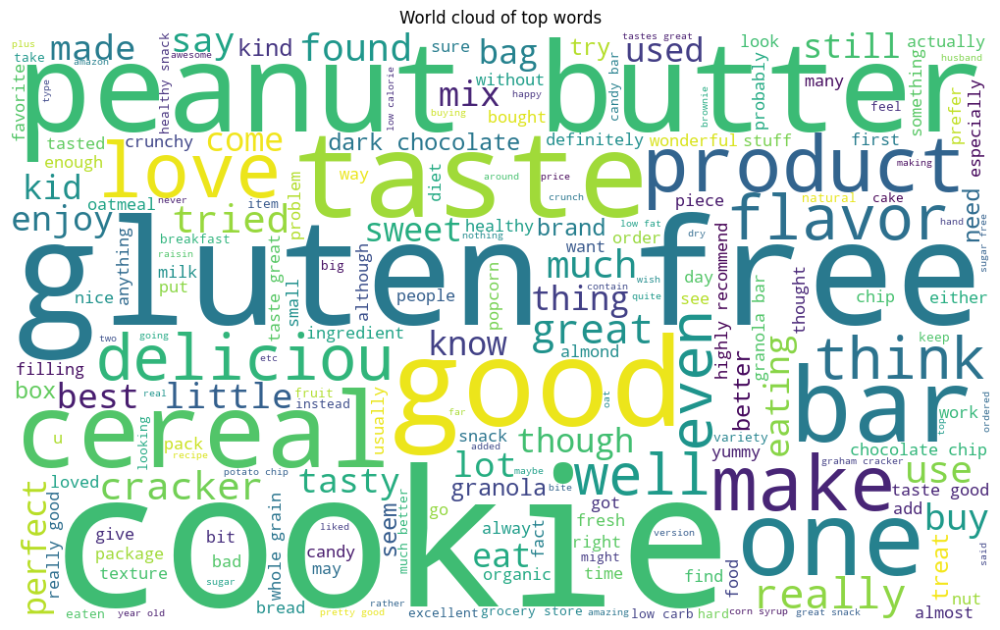

Total number of review in cluster 8 is: 36154


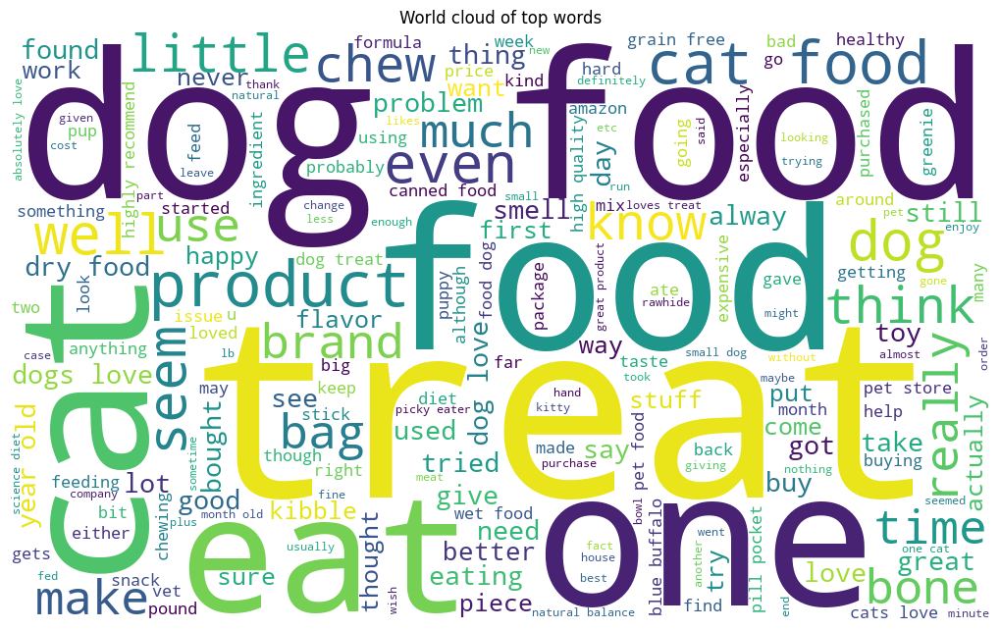

In [85]:
# For each cluster, group with its corresponding label.
for i in range(kmeans.n_clusters):
    l = list()
    label = review_data.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(review_data.loc[label[j]]["Text"])
    print("Total number of review in cluster {} is: {}".format(i+1, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

In [86]:
# Agglomerative Clustering

In [88]:
# TFIDF W2V

In [14]:
AC = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
ac_model_data = AC.fit_predict(X_tfw2v[:50000])

In [15]:
review_data_sample = review_data[:50000]
review_data_sample["cluster_label"] = AC.labels_

In [16]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

Total number of review in cluster 1 is: 20207


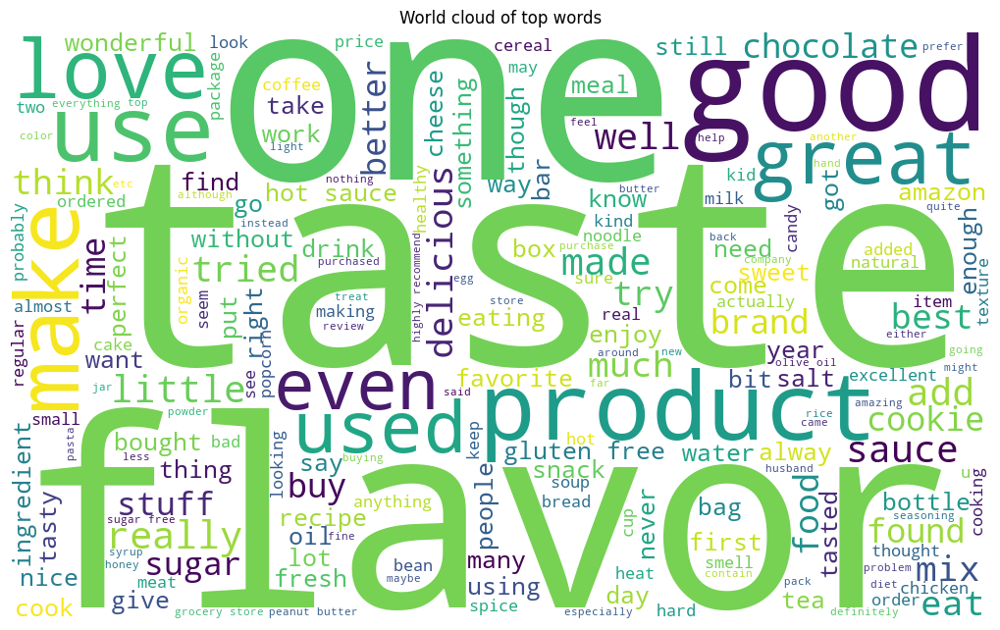

Total number of review in cluster 2 is: 6053


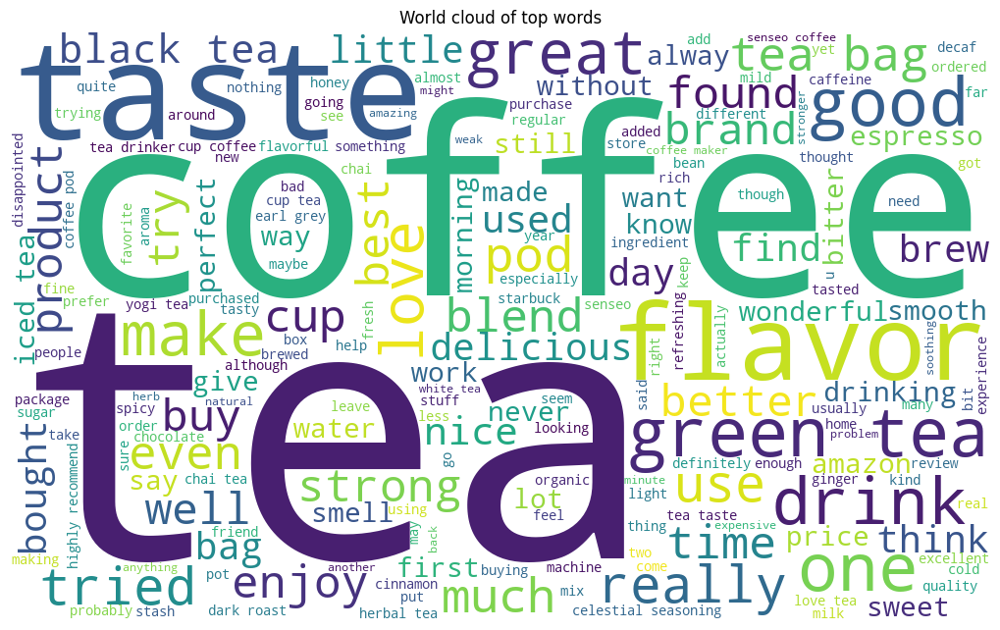

Total number of review in cluster 3 is: 12594


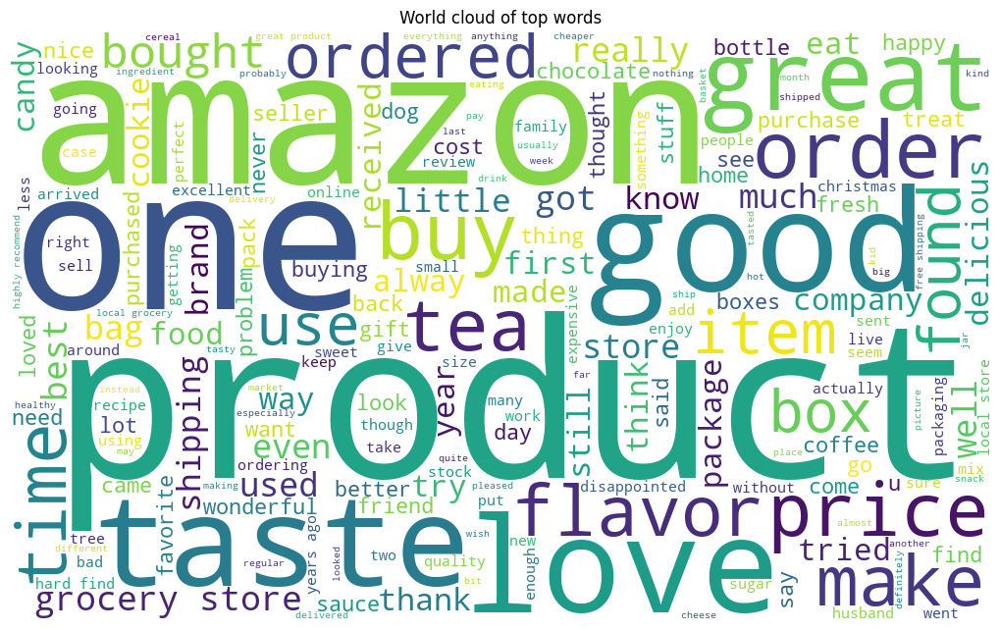

Total number of review in cluster 4 is: 4053


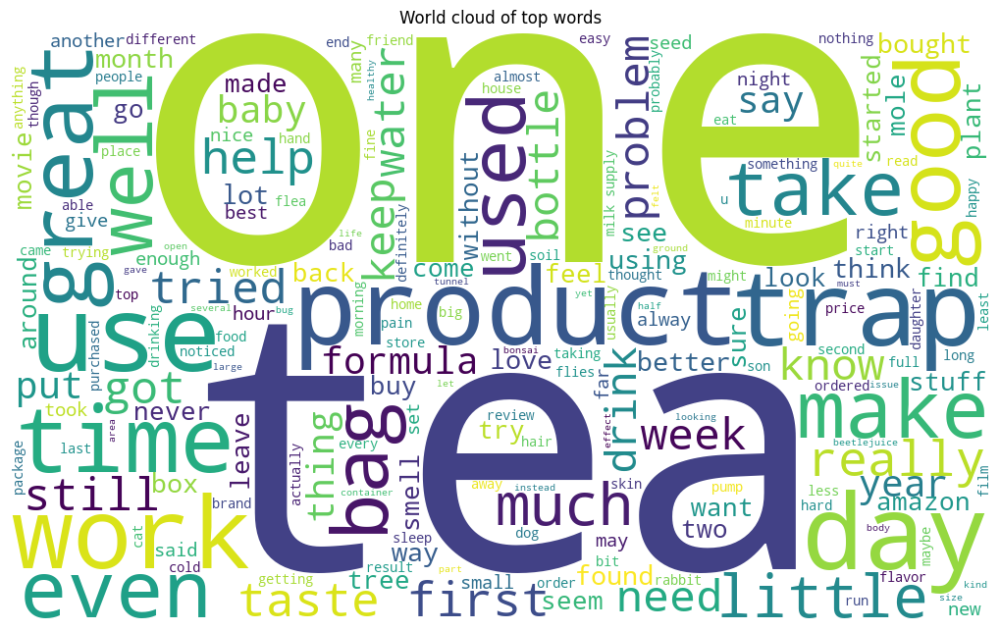

Total number of review in cluster 5 is: 7093


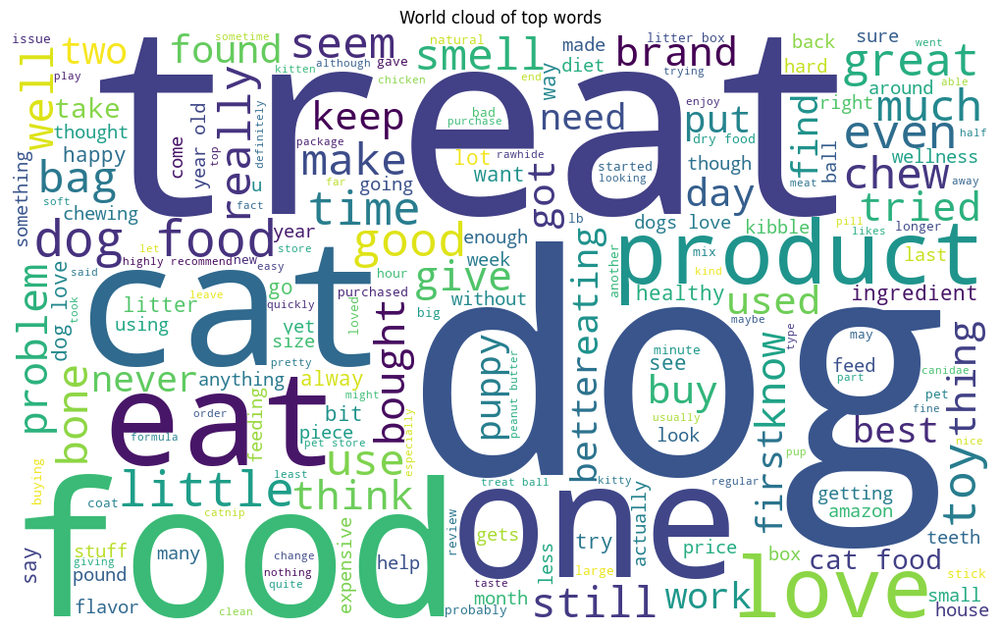

In [17]:
# For each cluster, group with its corresponding label.
for i in range(AC.n_clusters):
    l = list()
    label = review_data_sample.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(review_data_sample.loc[label[j]]["Text"])
    print("Total number of review in cluster {} is: {}".format(i+1, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

In [18]:
# DBSCAN Clustering

In [19]:
# TFIDF W2V

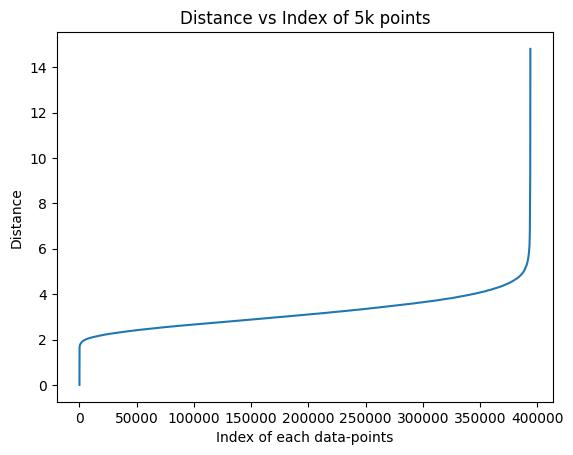

In [20]:
# Elbow method to choose eps(epsilon) with minpts = 2 * dimension of data (ie. 50*2=100)
from sklearn.neighbors import NearestNeighbors
minpts = 100
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
# Fitting classifier
clf.fit(X_tfw2v)
# Find the k neighbors of each xi and will return distance to its neighbors and indices of each xi's
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
# Get the distance and indices of the last neighbor
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
# Sort distances according to ascending order
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
# Get the index and distance and store it in two different variable
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
# Plot index on x-axis and distance on y-axis
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [15]:
# DBSCAN 
db = DBSCAN(eps = 5.0, min_samples = 10)
db.fit(X_tfw2v[:50000])
label = db.labels_
label

array([0, 0, 0, ..., 0, 0, 0])

In [16]:
# Total number of data-points from each cluster 
# -1 shows it is noisy data-points 
print(list(label).count(0))
print(list(label).count(-1))

49868
132


In [17]:
review_data_sample = review_data[:50000]
review_data_sample["cluster_label"] = db.labels_

In [20]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

Total number of review in cluster 1 is: 49868


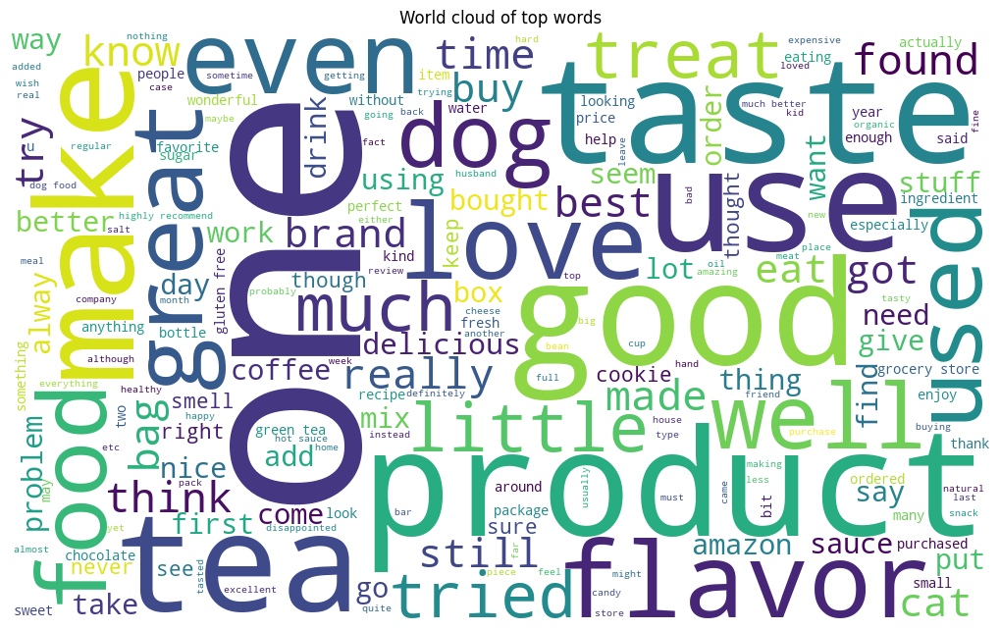

In [22]:
# Same as average word2vec of k means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = review_data_sample.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(review_data_sample.loc[label[j]]["Text"])
    print("Total number of review in cluster {} is: {}".format(i+1, len(label)))
    plot_word_cloud(l)
    break